# Interpreting Image Classification of Keras InceptionV3

This notebook examines the predictions of an image classfifier (CNN InceptionV3) using two interpretation methods:

> * LimeImageExplainer (LIME)
> * Class Activation Maps (CAM)

* First, LIME and CAM will be applied on a single prediction to make their concepts easier to understand. 
* In the following section, both methods are systematically applied to a group of predictions and compared using their masks
* The Images used in this notebook can be downloaded from ImageNet: [*Download from here*](http://image-net.org/download-bboxes)

In [1]:
#process not on GPU
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''

In [2]:
# Keras
import keras
from keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
from keras.preprocessing.image import load_img, img_to_array
# Tools requiered for visualizing and processing
import matplotlib.pyplot as plt
import pandas as pd

In [6]:
model_InceptionV3 = InceptionV3(weights = 'imagenet')

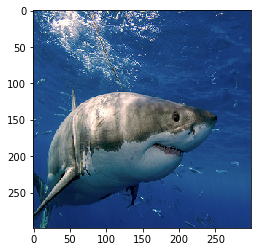

In [7]:
# Load image and scale to 299x299
image_raw = load_img("/home/common_files/datasets/imagenet/bounding_boxes/n01484850/n01484850_10798.jpg",target_size = (299,299))
plt.imshow(image_raw)

In [8]:
# Preprocess image in an array to make it compatible with the Keras model and reshape it.
image = img_to_array(image_raw)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)

In [9]:
# Predict label of image
prediction = model_InceptionV3.predict(image)
pd.DataFrame(decode_predictions(prediction, top=3)[0],columns=['col1','class','probability']).iloc[:,1:]

,class,probability
0,great_white_shark,0.938497
1,tiger_shark,0.001046
2,grey_whale,0.000489


In [10]:
import lime
from lime.lime_image import LimeImageExplainer
# Requiered segmentation package for creating superpixel of image
from skimage.segmentation import mark_boundaries, quickshift
import numpy as np

In [11]:
explainer = LimeImageExplainer()

Number of superpixel:  65


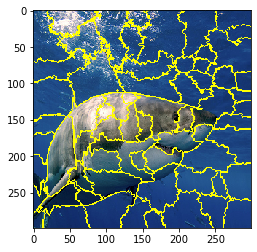

In [12]:
# This part is optional and is listed to make clear the idea behind LimeImageExplainer. This means Lime does this automatically in the back.
# Lime is creating superpixels using the segmentation algorithm quickshift like below, and predicts the image user-defined-times by turning superpixel on and off

segments = quickshift(image_raw, kernel_size=4, max_dist=200, ratio=0.2,random_seed=42)
superpixel = mark_boundaries(image_raw, segments)
plt.imshow(superpixel)
print('Number of superpixel: ',len(np.unique(segments)))

In [13]:
# pass image as (299,299,3)-Array 299x299Pixel in RGB
# top_labels = 3 -> create explanation for top three labels predicted by the model for image
# num_samples = 500 -> create 500 similiar pictures by turning superpixel on and off 
# random_seed = 42 -> for reproducability of segmenation (superpixel)

explanation = explainer.explain_instance(image[0], model_InceptionV3.predict, top_labels = 3, num_samples = 500, random_seed = 42)

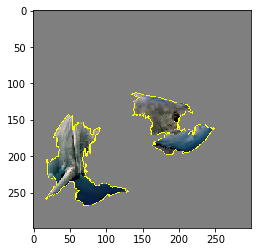

In [14]:
# Show top five (by default) Superpixel with positive weights supported decision making

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True,  hide_rest=True)
top_superpixels = mark_boundaries(temp / 2 + .5,mask)
plt.imshow(top_superpixels)

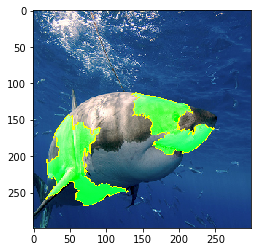

In [15]:
# explanation.top_labels[0] -> index of highest probable predicted class
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False,   hide_rest=False)
top_superpixels = mark_boundaries(temp /2 + .5,mask)
plt.imshow(top_superpixels)

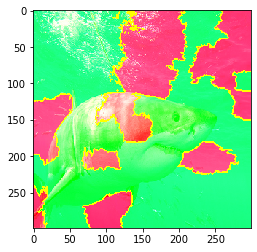

In [16]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=len(np.unique(segments)),hide_rest=False)
top_superpixels = mark_boundaries(temp /2 + .5,mask)
plt.imshow(top_superpixels)

In [17]:
results_images_df = pd.read_hdf('results-inceptionv3-1.h5',key='pictures')
results_images_df.sort_values(['confidence_difference'], ascending=False).head(5)

,label_id,label_name1,label_name2,prediction_id,prediction_name1,prediction_name2,file_name,confidence_in_prediction,prediction_in_top_5,confidence_in_label,confidence_difference
0,207,n02099601,golden_retriever,971,n09229709,bubble,n02099601/n02099601_4933.jpg,1.0,False,2.533398e-08,1.0
0,207,n02099601,golden_retriever,475,n02965783,car_mirror,n02099601/n02099601_2077.jpg,1.0,False,4.801222e-11,1.0
0,263,n02113023,Pembroke,805,n04254680,soccer_ball,n02113023/n02113023_8857.jpg,1.0,False,1.617717e-08,1.0
0,541,n03249569,drum,822,n04311174,steel_drum,n03249569/n03249569_14988.jpg,1.0,False,2.191712e-08,1.0
0,880,n04509417,unicycle,475,n02965783,car_mirror,n04509417/n04509417_1366.jpg,1.0,False,5.660312e-10,1.0


In [18]:
%%html
<style>
table {float:left}
</style>

### Columns of dataset explained

| Column | Explanation |
| --- | --- |
| label_id | index of actual label |
| label_name1 | encoded actual label |
| label_name2  | decoded actual label |
| prediction_id | index of predicted label |
| prediction_name1 | encoded predicted label |
| prediction_name2 | decoded predicted label |
| file_name | directory of image |
| confidence_in_prediction | probability for predicted label by model |
| prediction_in_top_5 | True, if actual label is in top five of predicted classes, otherwise False |
|confidence_in_label   | probability for actual label predicted by model|
confidence_difference   |confidence_in_prediction - confidence_in_label|

In [19]:
# To load images
def get_image(image_dir):
    image = load_img("/home/common_files/datasets/imagenet/pictures/"+image_dir,target_size = (299,299))
    return image    

In [20]:
# Preprocess image in an array to make it compatible with the Keras model and reshape it. 
def preprocess_image(image_raw):
    image = img_to_array(image_raw)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    return image[0]

In [21]:
# Create explanation of Image
def explanation_for_instance(image,model):
    explanation = explainer.explain_instance(image,model.predict,top_labels = 1,num_samples=500,random_seed=42)
    return explanation

In [22]:
# Mask explanation and return top ten superpixel for most probable prediction of model and hide rest of image
def get_explained_image(explanation, positive_only, hide_rest):
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only = positive_only, num_features=10, hide_rest=hide_rest)
    bounderies = mark_boundaries(temp /2 + .5,mask)
    return bounderies

### Create explanation in loop

* We want to create explanations for only images where confidence_difference is higher than 0.98 since we have more than 100 000 false predictions 
* And it takes to much time generate an explanation for an image

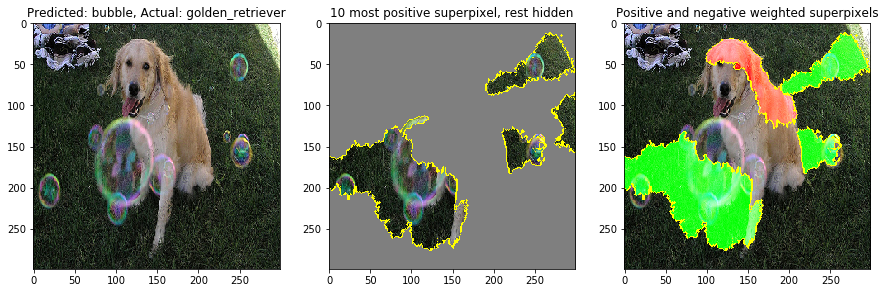

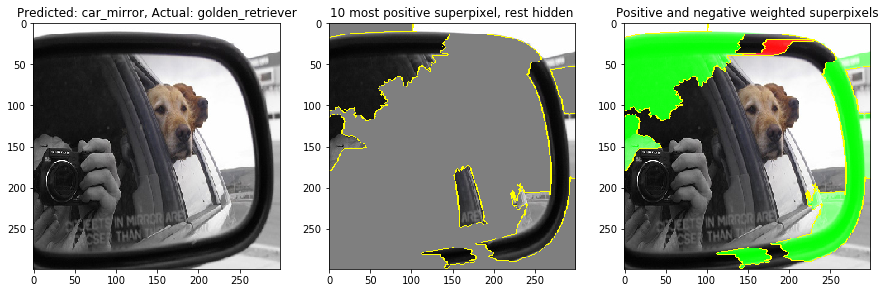

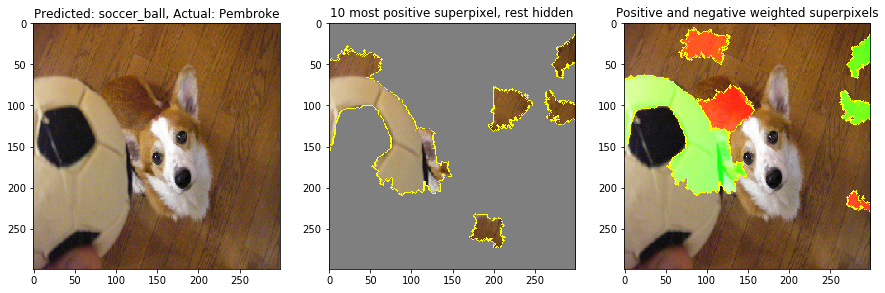

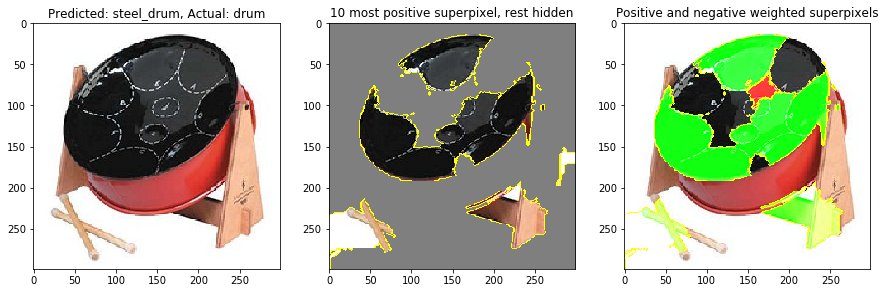

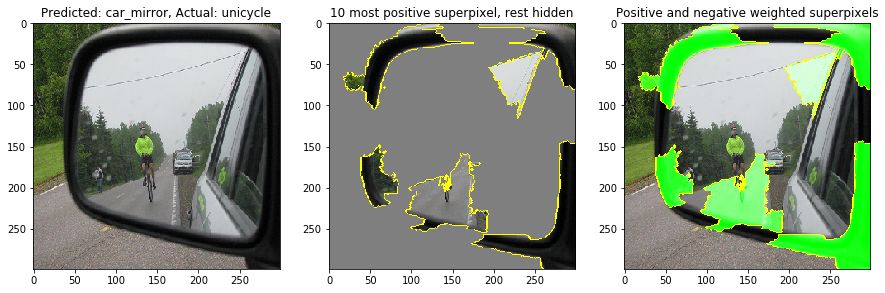

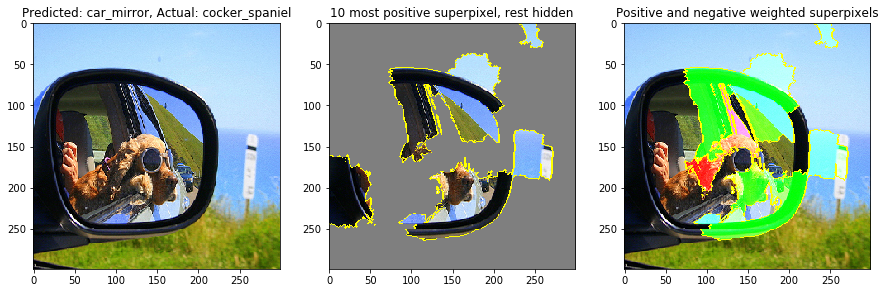

In [38]:
# Order dataframe by confidence_difference descending to make iteration more efficent
results_images_df = results_images_df.sort_values(['confidence_difference'], ascending=False)

# Create explanation in loop

for i in range(len(results_images_df)):
    
    file_name = results_images_df.iloc[i]['file_name']
    image_raw = get_image(file_name)
    image = preprocess_image(image_raw)
    # Create explanation for predicted label
    explanation = explanation_for_instance(image, model_InceptionV3)
    # get explained image with 10 positive weighted superpixel and hide rest
    explained_image_positive_and_hidden = get_explained_image(explanation, positive_only = True, hide_rest= True)
    # get explained image with 10 positive or negative weigthed superpixel, hide_rest = False
    explained_image_pos_neg = get_explained_image(explanation, positive_only = False, hide_rest= False)
    
    #plt.savefig('../Output_Images/Predicted_ {}, Actual_ {}'.format(results_images_df.iloc[i]['prediction_name2'],results_images_df.iloc[i]['label_name2']))
    
    #plot only first 10
    if i < 10:
        
        fig, ax = plt.subplots(1,3, figsize = (15,15))
        ax[0].imshow(image_raw)
        ax[0].set_title('Predicted: {}, Actual: {}'.format(results_images_df.iloc[i]['prediction_name2'],results_images_df.iloc[i]['label_name2']), fontsize =12)
        ax[1].imshow(explained_image_positive_and_hidden)
        ax[1].set_title('10 most positive superpixel, rest hidden')
        ax[2].imshow(explained_image_pos_neg)
        ax[2].set_title('Positive and negative weighted superpixels')
        plt.show()
    
    if results_images_df.iloc[i]['confidence_difference'] < 0.98:
        break
    # break after 5th image
    if i >=5:
        break

## Lime vs Class Activation Maps

* In this section Class Activation Maps are generated and compared with the results of the LimeImageExplainer.

* Class Activation Maps are simple to implement and can help to get the discriminative image regions used by a CNN to identify a specific class in the image. 

* Class Activation Maps are often called as Attention Maps

### Get Class Activation Map for a single prediction

In [26]:
# import keras-vis
import vis
from vis.utils import utils
from vis.visualization import overlay, visualize_cam
from keras import activations
import os
import xml.etree.ElementTree as ET
import matplotlib.patches as patches
import h5py
import seaborn as sns
import json

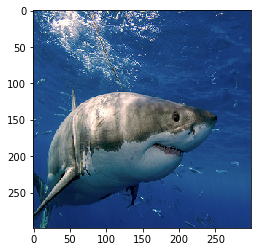

In [27]:
image_raw = load_img("/home/common_files/datasets/imagenet/bounding_boxes/n01484850/n01484850_10798.jpg",target_size = (299,299))
plt.imshow(image_raw)

In [28]:
image = img_to_array(image_raw)
image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
image = preprocess_input(image)

In [29]:
prediction = model_InceptionV3.predict(image)
print(pd.DataFrame(decode_predictions(prediction, top=3)[0],columns=['col1','class','probability']).iloc[:,1:])
# get corrosponding imagenet index for prediction
argmax = np.argmax(prediction[0])
print('\nImageNet Index for prediction: ',argmax)

               class  probability
0  great_white_shark     0.938497
1        tiger_shark     0.001046
2         grey_whale     0.000489

ImageNet Index for prediction:  2


In [30]:
# get last layer
prediction_layer = model_InceptionV3.get_layer('predictions')
print(prediction_layer)

In [31]:
# get index of last layer
prediction_layer_idx = utils.find_layer_idx(model_InceptionV3, 'predictions')
print(prediction_layer_idx)

312


(299, 299, 3)

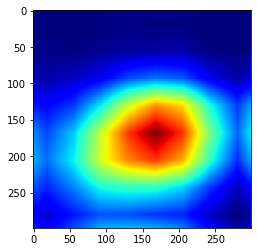

In [32]:
cam = visualize_cam(model=model_InceptionV3, layer_idx=prediction_layer_idx, filter_indices=argmax, seed_input=image)
plt.imshow(cam)
cam.shape

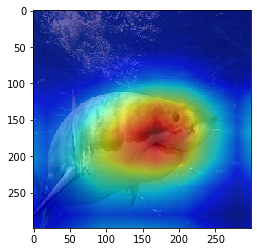

In [33]:
plt.imshow(overlay(np.array(image_raw),cam, alpha=0.4))

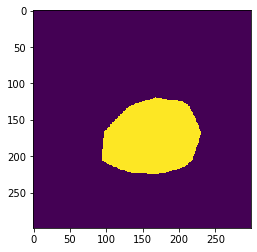

In [34]:
# Get the red area of the attention_map (most positive area for classification of cnn)
# where blue channel is under 100
cam_mask = np.zeros((299,299))
mask = (cam[:,:,2] < 30)
cam_mask[mask] = 1
plt.imshow(cam_mask)

Explanation score:  0.4615498348087531


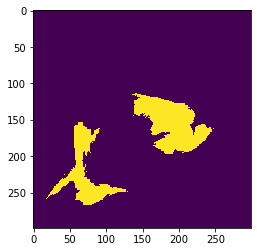

In [35]:
# get lime mask for top 5 superpixel of actual label
explanation = explainer.explain_instance(image[0], model_InceptionV3.predict, num_samples = 500, labels = (argmax,), top_labels = None, random_seed = 42)
temp, lime_mask = explanation.get_image_and_mask(argmax, positive_only = True,  hide_rest = True)
boundaries = mark_boundaries(temp/2+.5, lime_mask)
plt.imshow(lime_mask)
print('Explanation score: ', explanation.score )

## Compare Lime with bounding boxes

[{'xmin': 1, 'ymin': 118, 'xmax': 422, 'ymax': 332, 'xminScalled': 0, 'yminScalled': 105, 'xmaxScalled': 252, 'ymaxScalled': 298, 'xdiff': 421, 'ydiff': 214, 'xdiffScalled': 252, 'ydiffScalled': 193}]


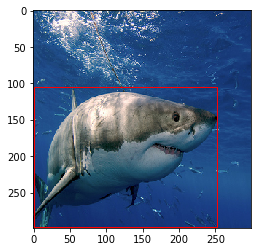

In [35]:
# get image with bounding box

path_to_xml = '/home/common_files/datasets/imagenet/bounding_boxes/n01484850/n01484850_10798.xml'

bounding_boxes = loadBoundingBoxes(path_to_xml,np.array(image_raw).shape[0],np.array(image_raw).shape[1])

# Create rectangle patch
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.imshow(np.array(image_raw))

for bounding_box in bounding_boxes:
    rect = patches.Rectangle((bounding_box['xminScalled'],bounding_box['yminScalled']),bounding_box['xdiffScalled'],bounding_box['ydiffScalled'],linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)

plt.show()

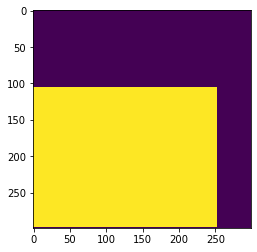

In [36]:
# get mask for bounding box

bounding_box_mask = np.zeros((299,299))
for bounding_box in bounding_boxes:
        bounding_box_mask[bounding_box['yminScalled']:bounding_box['ymaxScalled'],bounding_box['xminScalled']:bounding_box['xmaxScalled']] = 1
plt.imshow(bounding_box_mask)

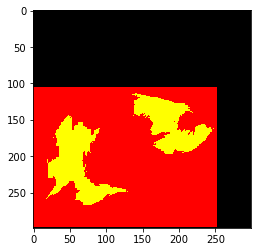

In [37]:
# compare masks:  goal is to get intersection of both masks and see the percentage of lime in bounding box

both_masks = np.zeros((299,299,3))
both_masks[:,:,0] = bounding_box_mask
both_masks[:,:,1] = lime_mask

plt.imshow(both_masks)

In [38]:
pixel_both_masks = ((lime_mask+bounding_box_mask) == 2).sum()
pixel_lime_mask = (lime_mask == 1).sum() - pixel_both_masks
lime_in_bounding_box = pixel_both_masks / (pixel_lime_mask + pixel_both_masks)
print('Lime explanation in bounding box in %: ',lime_in_bounding_box * 100)

Lime explanation in bounding box in %:  100.0


## Compare Class Activation Map with bounding boxes

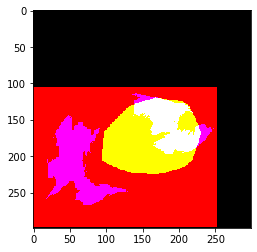

In [39]:
both_masks = np.zeros((299,299,3))
both_masks[:,:,0] = bounding_box_mask
both_masks[:,:,1] = cam_mask
both_masks[:,:,2] = lime_mask

plt.imshow(both_masks)

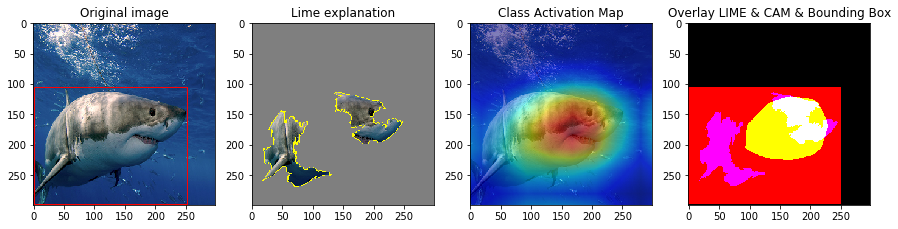

In [40]:
fig, ax = plt.subplots(1,4, figsize = (15,15))
ax[0].imshow(np.array(image_raw))

for bounding_box in bounding_boxes:
    rect = patches.Rectangle((bounding_box['xminScalled'],bounding_box['yminScalled']),bounding_box['xdiffScalled'],bounding_box['ydiffScalled'],linewidth=1,edgecolor='r',facecolor='none')
    ax[0].add_patch(rect)
ax[0].set_title('Original image')
ax[1].imshow(boundaries)
ax[1].set_title('Lime explanation')
ax[2].imshow(overlay(np.array(image_raw),cam, alpha=0.5))
ax[2].set_title('Class Activation Map')
ax[3].imshow(both_masks)
ax[3].set_title('Overlay LIME & CAM & Bounding Box')
plt.show()

In [41]:
both_masks = np.zeros((299,299,3))
pixel_both_masks = ((cam_mask+bounding_box_mask) == 2).sum()
pixel_cam_mask = (cam_mask == 1).sum() - pixel_both_masks
cam_in_bounding_box = pixel_both_masks / (pixel_cam_mask + pixel_both_masks)
print('Class Activation Map in bounding box in %: ',cam_in_bounding_box * 100)

Class Activation Map in bounding box in %:  100.0


## Approach to detect bias and weaknesses in training data systematically using Lime and Class Activation Maps

* We predicted 11 100 images using the InceptionV3 CNN and saved the results in a dataframe
* Dataframe contains masks of explanations, bounding boxes and predicted classes
* In total 222 classes, each 50 Samples

In [42]:
base_path = '/home/common_files/datasets/imagenet/bounding_boxes'
results_file = '/home/viscif/akif/mask_results.h5'

#### Get class names of images

In [43]:
# Get class names of images
class_names = []
if os.path.isfile(results_file):
    with h5py.File(results_file, 'r') as hf:
        keys = hf.keys()
        #print(keys)
        for x in keys:
            class_names.append(x)

In [44]:
# get class names with indexes from imagenet json file and store as key value pairs 
classJSON = "/home/viscif/.keras/models/imagenet_class_index.json"

with open(classJSON) as json_file:
    label_list = json.load(json_file)
invers_label_list = {}
for class_ID, value in label_list.items():
    invers_label_list[value[0]] = int(class_ID)
    
# for example get label and label_name for image index 0
label_list['0']

['n01440764', 'tench']

### Get masks for Bounding Boxes and Class Activation Maps

In [45]:
def get_bounding_box_mask(bounding_boxes):
    bounding_box_mask = np.zeros((299,299))
    for bounding_box in bounding_boxes:
        bounding_box_mask[bounding_box['yminScalled']:bounding_box['ymaxScalled'],bounding_box['xminScalled']:bounding_box['xmaxScalled']] = 1
    return bounding_box_mask

In [46]:
def get_cam_mask(cam):
    cam_mask = np.zeros((cam.shape[0],cam.shape[1]))
    # get area where red channel is higher than 100
    mask = (cam[:,:,0] > 100)
    cam_mask[mask] = 1
    return cam_mask

### Get size of intersection area between LIME and Bounding Boxes, CAM and Bounding Boxes, and its propotion in % for each image (sample)

In [47]:
# analyze row wise
def analyze_row(dataset_row):
    
    # get data
    file_name = dataset_row['filename']
    actual_image_class =  dataset_row['imageClass']
    actual_image_class_index = dataset_row['imageClassID']
    actual_image_class_name = label_list['{}'.format(actual_image_class_index)][1]
    cam_map = dataset_row['attentionMap']
    cam_mask = get_cam_mask(cam_map)
    lime_mask = dataset_row['LimeMask']
    bounding_box = dataset_row['boundingBoxes']
    bounding_box_mask = get_bounding_box_mask(bounding_box)
    predictions = dataset_row['prediction']
    predicted_image_class_index = np.argmax(predictions)
    predicted_image_class = label_list['{}'.format(predicted_image_class_index)][0]
    predicted_image_class_name = label_list['{}'.format(predicted_image_class_index)][1]
    
    # get rank of actual label in predictions
    y = predictions.argsort()
    rank = (len(y) - np.argwhere(y == actual_image_class_index))[0][0]
    
    # calculate total size of areas of masks
    area_bounding_box = ((bounding_box_mask) == 1).sum()
    area_lime = ((lime_mask) == 1).sum()
    area_cam = ((cam_mask) == 1).sum()
    
    # get intersection between lime and bounding box
    area_intersection_boundingbox_lime = ((bounding_box_mask + lime_mask) == 2).sum()
    
    # get intersection between cam and bounding box
    area_intersection_boundingbox_cam = ((bounding_box_mask + cam_mask) == 2).sum()
    
    # get overlap in percentage
    overlap_lime_bounding_box = max(area_intersection_boundingbox_lime / area_lime, area_intersection_boundingbox_lime / area_bounding_box)
    overlap_cam_bounding_box = max(area_intersection_boundingbox_cam / area_cam, area_intersection_boundingbox_cam / area_bounding_box)
    
    # lime explanation score
    lime_explanation_score = dataset_row['lime_score']
    
    
    data = {
        
        'file_name' : [file_name],
        'actual_image_class' : [actual_image_class],
        'actual_image_class_index' : [actual_image_class_index],
        'actual_image_class_name' : [actual_image_class_name],
        'predicted_image_class' : [predicted_image_class],
        'predicted_image_class_index' : [predicted_image_class_index],
        'predicted_image_class_name' : [predicted_image_class_name],
        'rank_of_actual_label_in_prediction' : [rank],
        'area_lime' : [area_lime],
        'area_cam' : [area_cam],
        'area_intersection_boundingbox_cam' : [area_intersection_boundingbox_cam],
        'area_intersection_boundingbox_lime' : [area_intersection_boundingbox_lime],
        'overlap_lime_bounding_box' : [overlap_lime_bounding_box],
        'overlap_cam_bounding_box' : [overlap_cam_bounding_box],
        'lime_explanation_score' : [lime_explanation_score],
   }
    
    return data


#### Load all results in a dataframe and a dictionary (key = class_name: value = data)

In [48]:
all_results_dict = {}
all_results_df = pd.DataFrame()
for class_name in class_names:
    
    class_results = pd.DataFrame()
    dataset = pd.read_hdf(results_file, key = class_name)
    
    for i in range(len(dataset)):
        row = dataset.iloc[i]

        data = analyze_row(row)
        class_results = class_results.append(pd.DataFrame(data), ignore_index = True)
        all_results_df = all_results_df.append(pd.DataFrame(data), ignore_index=True)
        
    all_results_dict.update({class_name : class_results})
    

#### Dictionary with all results of images stored by key = actual_image_class

In [49]:
all_results_dict['n01443537'].head(5)

,file_name,actual_image_class,actual_image_class_index,actual_image_class_name,predicted_image_class,predicted_image_class_index,predicted_image_class_name,rank_of_actual_label_in_prediction,area_lime,area_cam,area_intersection_boundingbox_cam,area_intersection_boundingbox_lime,overlap_lime_bounding_box,overlap_cam_bounding_box,lime_explanation_score
0,n01443537_15077.jpg,n01443537,1,goldfish,n01440764,0,tench,2,4764,8064,8064,1692,0.355164,1.000000,0.754628
1,n01443537_3770.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,9167,21189,19553,9167,1.000000,0.922790,0.866595
2,n01443537_14753.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,10706,23889,21674,10131,0.946292,0.907280,0.695441
3,n01443537_15164.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,7263,25074,24831,7151,0.984579,0.990309,0.817954
4,n01443537_17158.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,10899,14215,14215,9345,0.857418,1.000000,0.685793


#### Dataframe with all results of images

In [50]:
all_results_df.head(5)

,file_name,actual_image_class,actual_image_class_index,actual_image_class_name,predicted_image_class,predicted_image_class_index,predicted_image_class_name,rank_of_actual_label_in_prediction,area_lime,area_cam,area_intersection_boundingbox_cam,area_intersection_boundingbox_lime,overlap_lime_bounding_box,overlap_cam_bounding_box,lime_explanation_score
0,n01443537_15077.jpg,n01443537,1,goldfish,n01440764,0,tench,2,4764,8064,8064,1692,0.355164,1.000000,0.754628
1,n01443537_3770.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,9167,21189,19553,9167,1.000000,0.922790,0.866595
2,n01443537_14753.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,10706,23889,21674,10131,0.946292,0.907280,0.695441
3,n01443537_15164.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,7263,25074,24831,7151,0.984579,0.990309,0.817954
4,n01443537_17158.jpg,n01443537,1,goldfish,n01443537,1,goldfish,1,10899,14215,14215,9345,0.857418,1.000000,0.685793


#### Get statistics for all images in dataframe

In [51]:
all_results_df.describe()

,actual_image_class_index,predicted_image_class_index,rank_of_actual_label_in_prediction,area_lime,area_cam,area_intersection_boundingbox_cam,area_intersection_boundingbox_lime,overlap_lime_bounding_box,overlap_cam_bounding_box,lime_explanation_score
count,11100.000000,11100.000000,11100.000000,11100.000000,11100.000000,11100.000000,11100.000000,11100.000000,11093.000000,11100.000000
mean,483.648649,484.727477,1.473874,10124.092342,22194.892342,16187.004595,7254.651622,0.740144,0.799245,0.832392
std,283.801093,284.420150,7.121318,3298.999635,10844.926638,11250.360534,3985.937306,0.253294,0.269324,0.083350
min,1.000000,0.000000,1.000000,2400.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.173414
25%,237.000000,237.000000,1.000000,7767.500000,14807.500000,8277.000000,4410.750000,0.585225,0.729364,0.790363
50%,486.500000,489.000000,1.000000,9694.500000,19762.500000,14866.000000,7062.500000,0.808860,0.910648,0.847984
75%,733.000000,733.000000,1.000000,12028.000000,27404.750000,21981.000000,9818.000000,0.965548,0.989468,0.890675
max,999.000000,999.000000,420.000000,28845.000000,81219.000000,78912.000000,27706.000000,1.000000,1.000000,0.992284


#### Get correlation

In [52]:
all_results_df.corr()

,actual_image_class_index,predicted_image_class_index,rank_of_actual_label_in_prediction,area_lime,area_cam,area_intersection_boundingbox_cam,area_intersection_boundingbox_lime,overlap_lime_bounding_box,overlap_cam_bounding_box,lime_explanation_score
actual_image_class_index,1.000000,0.969502,0.023830,0.025868,0.158984,0.030454,-0.106007,-0.136302,-0.089448,-0.099630
predicted_image_class_index,0.969502,1.000000,0.016658,0.024409,0.149353,0.024698,-0.107839,-0.135871,-0.094904,-0.103194
rank_of_actual_label_in_prediction,0.023830,0.016658,1.000000,-0.022699,-0.054065,-0.069720,-0.052473,-0.061117,-0.103071,-0.061750
area_lime,0.025868,0.024409,-0.022699,1.000000,0.093452,0.130716,0.653848,0.110180,0.077209,-0.058426
area_cam,0.158984,0.149353,-0.054065,0.093452,1.000000,0.731747,0.179760,0.166410,0.190041,-0.024667
area_intersection_boundingbox_cam,0.030454,0.024698,-0.069720,0.130716,0.731747,1.000000,0.500874,0.507187,0.517551,-0.061575
area_intersection_boundingbox_lime,-0.106007,-0.107839,-0.052473,0.653848,0.179760,0.500874,1.000000,0.714436,0.329493,-0.016460
overlap_lime_bounding_box,-0.136302,-0.135871,-0.061117,0.110180,0.166410,0.507187,0.714436,1.000000,0.411369,0.065325
overlap_cam_bounding_box,-0.089448,-0.094904,-0.103071,0.077209,0.190041,0.517551,0.329493,0.411369,1.000000,0.006835
lime_explanation_score,-0.099630,-0.103194,-0.061750,-0.058426,-0.024667,-0.061575,-0.016460,0.065325,0.006835,1.000000


### Get statistics for each image class

In [53]:
# get statistics class wise

def get_statistics_for_classes(class_name):
    #print('class_name: ' ,class_name)
    min_overlap_lime_bb_percentage = all_results_dict[class_name]['overlap_lime_bounding_box'].min()
    mean_overlap_lime_bb_percentage = all_results_dict[class_name]['overlap_lime_bounding_box'].mean()
    max_overlap_lime_bb_percentage = all_results_dict[class_name]['overlap_lime_bounding_box'].max()
    std_overlap_lime_bb_percentage = all_results_dict[class_name]['overlap_lime_bounding_box'].std()
    
    min_lime_explanation_score = all_results_dict[class_name]['lime_explanation_score'].min()
    mean_lime_explanation_score = all_results_dict[class_name]['lime_explanation_score'].mean()
    max_lime_explanation_score = all_results_dict[class_name]['lime_explanation_score'].max()
    std_lime_explanation_score = all_results_dict[class_name]['lime_explanation_score'].std()
    corr_lime_exp_score_overlap = all_results_dict[class_name]['lime_explanation_score'].corr(all_results_dict[class_name]['overlap_lime_bounding_box'])
    
    min_overlap_cam_bb_percentage = all_results_dict[class_name]['overlap_cam_bounding_box'].min()
    mean_overlap_cam_bb_percentage = all_results_dict[class_name]['overlap_cam_bounding_box'].mean()
    max_overlap_cam_bb_percentage = all_results_dict[class_name]['overlap_cam_bounding_box'].max()
    std_overlap_cam_bb_percentage = all_results_dict[class_name]['overlap_cam_bounding_box'].std()
    
    # get accuracy for class
    true = all_results_dict[class_name]['rank_of_actual_label_in_prediction'].where((all_results_dict[class_name]['rank_of_actual_label_in_prediction'] == 1)).count()
    class_accuracy = true / all_results_dict[class_name]['rank_of_actual_label_in_prediction'].count()
    
    data = {
        'class_name' : [class_name],
        'class_accuracy' : [class_accuracy],
        'min_overlap_lime_bb_percentage' : [min_overlap_lime_bb_percentage], 
        'mean_overlap_lime_bb_percentage' : [mean_overlap_lime_bb_percentage],
        'max_overlap_lime_bb_percentage' : [max_overlap_lime_bb_percentage], 
        'std_overlap_lime_bb_percentage' : [std_overlap_lime_bb_percentage],
    
        'min_lime_explanation_score' : [min_lime_explanation_score],
        'mean_lime_explanation_score' : [mean_lime_explanation_score],
        'max_lime_explanation_score' : [max_lime_explanation_score], 
        'std_lime_explanation_score' : [std_lime_explanation_score], 
        'corr_lime_exp_score_overlap' : [corr_lime_exp_score_overlap],
        
        'min_overlap_cam_bb_percentage' : [min_overlap_cam_bb_percentage], 
        'mean_overlap_cam_bb_percentage' : [mean_overlap_cam_bb_percentage],
        'max_overlap_cam_bb_percentage' : [max_overlap_cam_bb_percentage], 
        'std_overlap_cam_bb_percentage' : [std_overlap_cam_bb_percentage]
        
        
    }

    return data


In [54]:
statistics_class_data = pd.DataFrame()

for class_name in class_names:
    statistics = get_statistics_for_classes(class_name)
    statistics_class_data = statistics_class_data.append(pd.DataFrame(statistics), ignore_index = True)


#### Show correlation between lime explanation score and the overlap of lime and bounding boxes

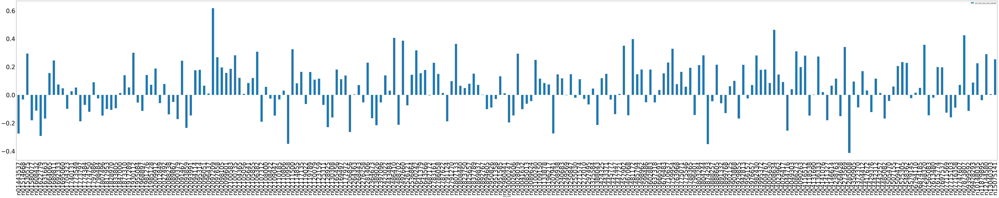

In [55]:
statistics_class_data.plot(kind='bar',x= 'class_name', y = ['corr_lime_exp_score_overlap'], figsize = (120,20), fontsize = 40)

In [56]:
statistics_class_data[(statistics_class_data['mean_overlap_lime_bb_percentage'] < 0.55)]

,class_name,class_accuracy,min_overlap_lime_bb_percentage,mean_overlap_lime_bb_percentage,max_overlap_lime_bb_percentage,std_overlap_lime_bb_percentage,min_lime_explanation_score,mean_lime_explanation_score,max_lime_explanation_score,std_lime_explanation_score,corr_lime_exp_score_overlap,min_overlap_cam_bb_percentage,mean_overlap_cam_bb_percentage,max_overlap_cam_bb_percentage,std_overlap_cam_bb_percentage
95,n02786058,0.78,0.000000,0.455146,0.959571,0.262416,0.558437,0.798119,0.947659,0.092930,0.149451,0.000000,0.530757,1.000000,0.415437
99,n02807133,0.96,0.000000,0.515116,0.946754,0.283383,0.543017,0.788100,0.979054,0.110215,0.362768,0.000000,0.808150,1.000000,0.232908
125,n03250847,0.80,0.000000,0.512461,1.000000,0.267173,0.653652,0.843100,0.982084,0.073166,0.147173,0.000000,0.554436,1.000000,0.340591
145,n03666591,0.92,0.099350,0.510497,1.000000,0.222811,0.506809,0.816477,0.986032,0.083523,0.035090,0.000000,0.514472,1.000000,0.341318
146,n03676483,0.82,0.000000,0.539601,1.000000,0.272468,0.462748,0.806826,0.945425,0.095942,0.153952,0.000000,0.573999,1.000000,0.347946
147,n03710637,0.36,0.031049,0.427715,0.993805,0.226262,0.681668,0.828558,0.914571,0.056866,0.230470,0.000000,0.490610,1.000000,0.368954
155,n03804744,0.92,0.000000,0.479744,1.000000,0.308172,0.561971,0.857881,0.952357,0.075261,0.281918,0.000000,0.790754,1.000000,0.232995
164,n03942813,0.90,0.000000,0.547116,1.000000,0.338883,0.526728,0.836150,0.991495,0.091756,0.213543,0.000000,0.725306,1.000000,0.411250
166,n03976657,0.70,0.095323,0.481183,1.000000,0.249255,0.707665,0.837414,0.929576,0.061386,0.070395,0.000000,0.571454,1.000000,0.323712
175,n04049303,0.92,0.000000,0.510640,0.998667,0.275320,0.671591,0.827143,0.955392,0.073205,0.041043,0.065703,0.799501,1.000000,0.217841


#### Plot ratio between Accuracy (blue), LIME overlap (yellow) and CAM overlap (green) for each image class

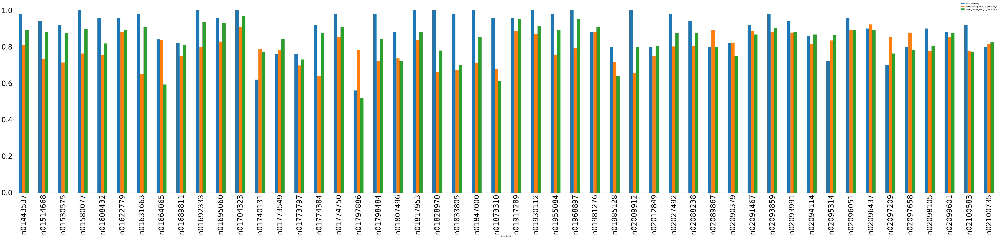

In [57]:
statistics_class_data[0:50].plot(kind='bar',x= 'class_name', y = ['class_accuracy', 'mean_overlap_lime_bb_percentage', 'mean_overlap_cam_bb_percentage'], figsize = (100,20), fontsize = 40)

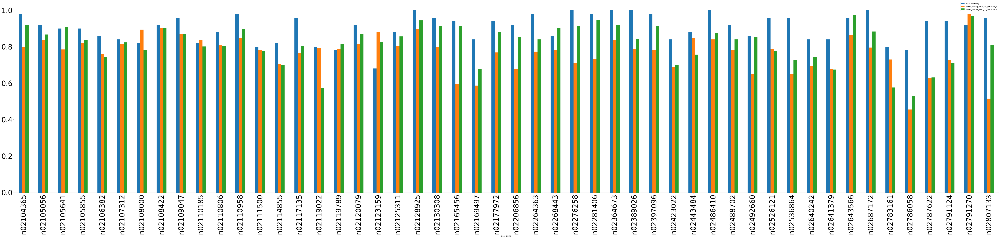

In [58]:
statistics_class_data[50:100].plot(kind='bar',x= 'class_name', y = ['class_accuracy', 'mean_overlap_lime_bb_percentage', 'mean_overlap_cam_bb_percentage'], figsize = (100,20), fontsize = 40 )

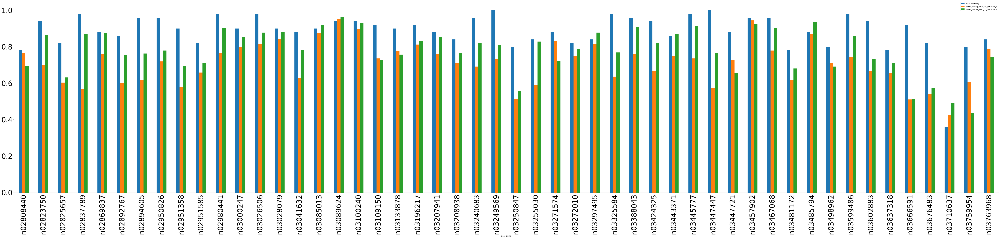

In [59]:
statistics_class_data[100:150].plot(kind='bar',x= 'class_name', y = ['class_accuracy', 'mean_overlap_lime_bb_percentage', 'mean_overlap_cam_bb_percentage'], figsize = (100,20), fontsize = 40)

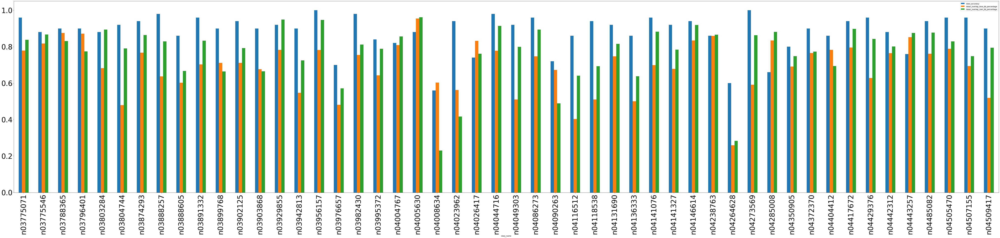

In [60]:
statistics_class_data[150:200].plot(kind='bar',x= 'class_name', y = ['class_accuracy', 'mean_overlap_lime_bb_percentage', 'mean_overlap_cam_bb_percentage'], figsize = (100,20), fontsize = 40)

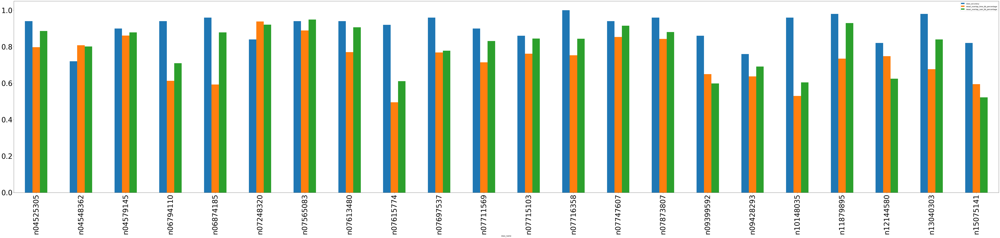

In [61]:
statistics_class_data[200:].plot(kind='bar',x= 'class_name', y = ['class_accuracy', 'mean_overlap_lime_bb_percentage', 'mean_overlap_cam_bb_percentage'], figsize = (100,20), fontsize = 40)

### Plot showy image classes observed from plots

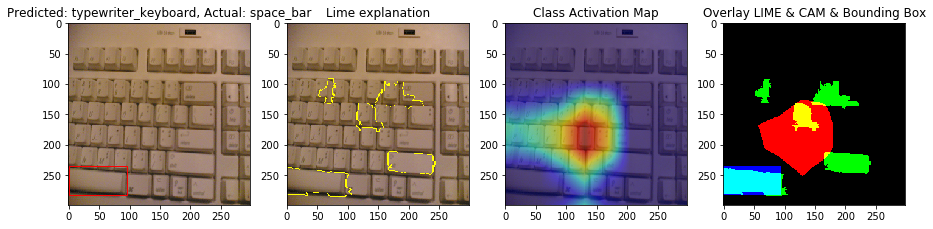

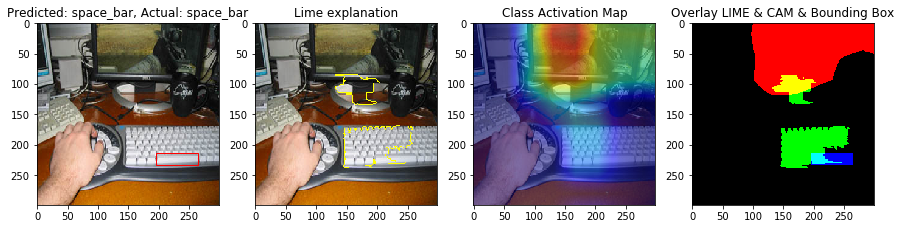

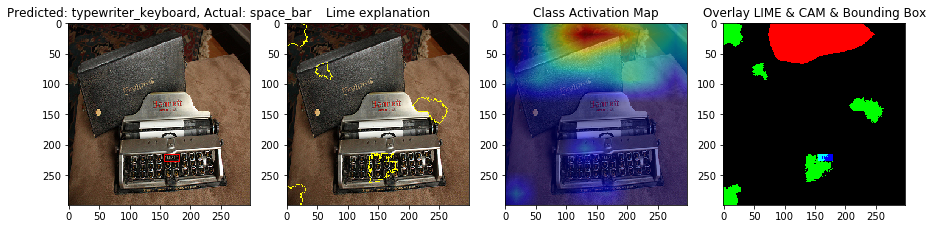

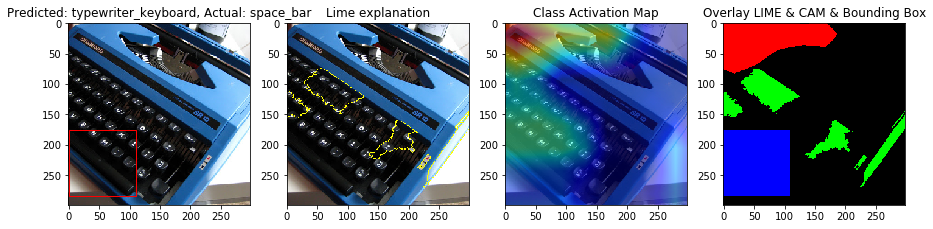

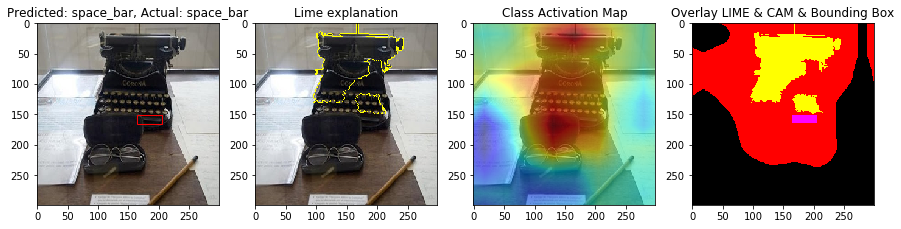

...

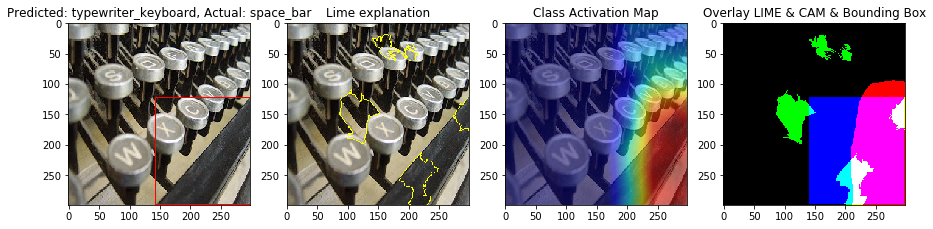

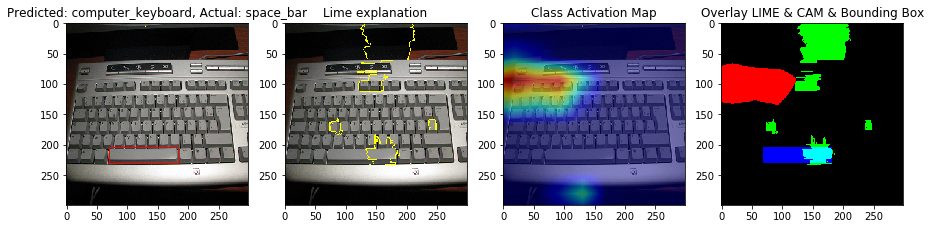

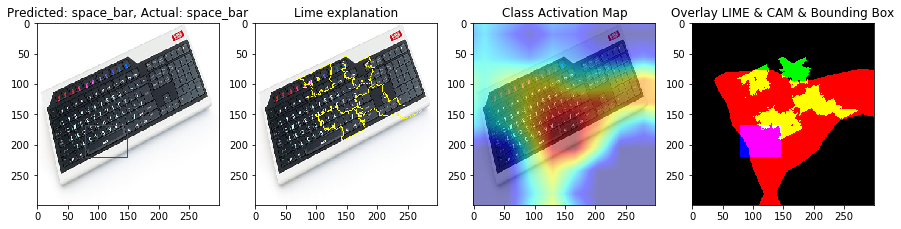

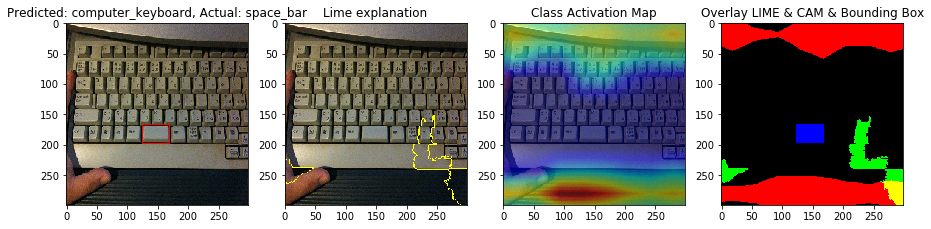

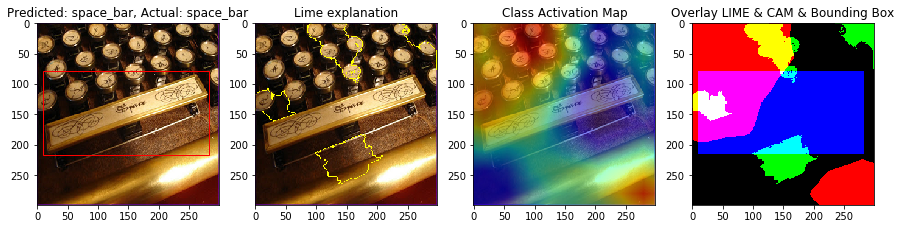

In [62]:
class_data = pd.read_hdf(results_file, key = 'n04264628')

for i in range(len(class_data)):
    row = class_data.iloc[i]
    print_row(row)

#### Get duplicated images in different classes by comparing their hash sums

In [63]:
hash_sums = pd.read_hdf('hashsums.h5', key = 'md5sums')

In [64]:
hash_sums[hash_sums.duplicated(['md5'])]

,class,file,md5
0,n04505470,n04505470_4387.jpg,8048af7aae2b9813ba43ded6c139e3a0
0,n04505470,n04505470_1600.jpg,327e2aa32a5ad356a1a3043dbf25ddae
0,n04505470,n04505470_1819.jpg,4852f9fe8a3ea99bf50b6eacd75f04af
0,n04505470,n04505470_3089.jpg,d2bef58ced592e683c6197b330c8842c
0,n04505470,n04505470_3418.jpg,31cf59963537d2a110eef45dfadfb70b
0,n04505470,n04505470_4717.jpg,1c69e7df9b12dc40a35f36a39ae94bce
0,n04505470,n04505470_2929.jpg,ae719aa030834ab6a0e56ef56677fcec
0,n04505470,n04505470_5057.jpg,aa03e6e773f0e53861baafebf752dc38
0,n04505470,n04505470_623.jpg,daa91ea84b017b253cb28a140fc9e0a0
0,n04505470,n04505470_4635.jpg,9a630d47a7938f306bdb52ccba7e03fd


In [65]:
# duplicated hash_sum
# get class and file name where hash sums are duplicated
hash_sums[hash_sums['md5'] == '9fa92749ffb0c9c01f40717bcad53d8c']

,class,file,md5
0,n03085013,n03085013_19020.jpg,9fa92749ffb0c9c01f40717bcad53d8c
0,n03832673,n03832673_11533.jpg,9fa92749ffb0c9c01f40717bcad53d8c


In [36]:
def print_row(dataset_row):
    
    # get data
    file_name = dataset_row['filename']
    actual_image_class =  dataset_row['imageClass']
    actual_image_class_index = dataset_row['imageClassID']
    actual_image_class_name = label_list['{}'.format(actual_image_class_index)][1]
    cam_map = dataset_row['attentionMap']
    cam_mask = get_cam_mask(cam_map)
    lime_mask = dataset_row['LimeMask']
    bounding_boxes = dataset_row['boundingBoxes']
    bounding_box_mask = get_bounding_box_mask(bounding_boxes)
    predictions = dataset_row['prediction']
    predicted_image_class_index = np.argmax(predictions)
    predicted_image_class = label_list['{}'.format(predicted_image_class_index)][0]
    predicted_image_class_name = label_list['{}'.format(predicted_image_class_index)][1]
    
    # get rank of actual label in predictions
    y = predictions.argsort()
    rank = (len(y) - np.argwhere(y == actual_image_class_index))[0][0]
    
    masks = np.zeros((299,299,3))
    masks[:,:,0] = cam_mask
    masks[:,:,1] = lime_mask
    masks[:,:,2] = bounding_box_mask
    
    image = load_img("{}/{}/{}".format(base_path, actual_image_class, file_name), target_size = (299,299))
    image = np.array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    fig, ax = plt.subplots(1,4, figsize = (15,15))
    
    ax[0].imshow(image[0])

    for bounding_box in bounding_boxes:
        rect = patches.Rectangle((bounding_box['xminScalled'],bounding_box['yminScalled']),bounding_box['xdiffScalled'],bounding_box['ydiffScalled'],linewidth=1,edgecolor='r',facecolor='none')
        ax[0].add_patch(rect)
    
    boundaries = mark_boundaries(image[0], lime_mask)
    
    ax[0].set_title('Predicted: {}, Actual: {}'.format(predicted_image_class_name, actual_image_class_name))
    ax[1].imshow(boundaries)
    ax[1].set_title('Lime explanation')
    ax[2].imshow(overlay(image[0],cam_map, alpha=0.5))
    ax[2].set_title('Class Activation Map')
    ax[3].imshow(masks)
    ax[3].set_title('Overlay LIME & CAM & Bounding Box')
    
    plt.show()
    

In [37]:
def loadBoundingBoxes(pathToXML, imageSizeX, imageSizeY):
    returnValues = []
    root = ET.parse(pathToXML).getroot()
    xmlImageX = root.findall('size/width')
    xmlImageY = root.findall('size/height')
    if len(xmlImageY) != 1:
        print("ERROR: more than 1 image heigth found")
    if len(xmlImageX) != 1:
        print("ERROR: more than 1 image width found")
    xmlImageX = int(xmlImageX[0].text)
    xmlImageY = int(xmlImageY[0].text)
    
    #print("xmlPictureSize: X: {}, Y: {}".format(xmlImageX, xmlImageY))
    
    xScallingFactor = imageSizeX*1.0 / xmlImageX
    yScallingFactor = imageSizeY*1.0 / xmlImageY
    #print("scalling factors x={} y={}".format(xScallingFactor, yScallingFactor))
    
    for bndbox in root.findall('object/bndbox'):
        boundingBox = {}
        for child in bndbox:
            boundingBox[child.tag] = int(child.text)
        boundingBox['xminScalled'] = int(boundingBox['xmin']*xScallingFactor)
        boundingBox['yminScalled'] = int(boundingBox['ymin']*yScallingFactor)
        boundingBox['xmaxScalled'] = int(boundingBox['xmax']*xScallingFactor)
        boundingBox['ymaxScalled'] = int(boundingBox['ymax']*yScallingFactor)
        boundingBox['xdiff'] = boundingBox['xmax'] - boundingBox['xmin']
        boundingBox['ydiff'] = boundingBox['ymax'] - boundingBox['ymin']
        boundingBox['xdiffScalled'] = boundingBox['xmaxScalled'] - boundingBox['xminScalled']
        boundingBox['ydiffScalled'] = boundingBox['ymaxScalled'] - boundingBox['yminScalled']
        returnValues.append(boundingBox)
    print(returnValues)
    return(returnValues)